# Setting

## Load libraries

- `matplotlib`: 最熱門的Python 2D 畫圖套件 [官網](https://matplotlib.org/)
- `seaborn`: 以`matplotlib`為基礎的畫圖套件，可以更容易地探索資料的樣態 [官網](https://seaborn.pydata.org/)

- `pandas`: Python中重要的資料分析套件 [官網](https://pandas.pydata.org/)

In [1]:
# install packages if you need it
# import sys
# !{sys.executable} -m pip install numpy matplotlib pandas sklearn seaborn calmap squarify plotly

In [17]:
# Load library for visualization
import matplotlib.pyplot as plt
import seaborn as sns

In [18]:
# Load library for data precessing
import pandas as pd  

## Set figure size

In [19]:
plt.rcParams['figure.figsize'] = [15, 10]

# 使用資料處理與介紹

### 載入資料

In [63]:
# Beijing air pollution data downloaded in 
# https://archive.ics.uci.edu/ml/datasets/Beijing+Multi-Site+Air-Quality+Data
# 請將Data資料夾放到桌面
df = pd.read_csv('~/Desktop/Data/PRSA_Data_Shunyi_20130301-20170228.csv') 
df.head()


,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,3.0,6.0,3.0,8.0,300.0,44.0,-0.9,1025.8,-20.5,0.0,NW,9.3,Shunyi
1,2,2013,3,1,1,12.0,12.0,3.0,7.0,300.0,47.0,-1.1,1026.1,-21.3,0.0,NW,9.4,Shunyi
2,3,2013,3,1,2,14.0,14.0,NaN,7.0,200.0,22.0,-1.7,1026.2,-23.0,0.0,NW,8.6,Shunyi
3,4,2013,3,1,3,12.0,12.0,3.0,5.0,NaN,NaN,-2.1,1027.3,-23.3,0.0,NW,6.6,Shunyi
4,5,2013,3,1,4,12.0,12.0,3.0,NaN,200.0,11.0,-2.4,1027.7,-22.9,0.0,NW,4.5,Shunyi


## 資料日期轉換
進一步將年/月/日/小時等欄位合併，並使用`pandas`的`to_datetime()`函數將原本的**字串型態**轉為**日期型態**。

In [64]:
# Parse String To DateTime
df['DateTime']=pd.to_datetime(df['year'].map(str) +
                              '/'+df['month'].map(str) +
                              '/'+df['day'].map(str) +
                              ' '+df['hour'].map(str)+':'+'00',
                              format='%Y/%m/%d %H:%M')
df[['year','month','day','hour','DateTime']]

,year,month,day,hour,DateTime
0,2013,3,1,0,2013-03-01 00:00:00
1,2013,3,1,1,2013-03-01 01:00:00
2,2013,3,1,2,2013-03-01 02:00:00
3,2013,3,1,3,2013-03-01 03:00:00
4,2013,3,1,4,2013-03-01 04:00:00
...,...,...,...,...,...
35059,2017,2,28,19,2017-02-28 19:00:00
35060,2017,2,28,20,2017-02-28 20:00:00
35061,2017,2,28,21,2017-02-28 21:00:00
35062,2017,2,28,22,2017-02-28 22:00:00


# 呈現資料分佈的圖形制作

## 直方圖 Histogram 

載入資料後，若想了解某一數據的**分佈**，可用直方圖呈現。
直方圖維度內容如下：
- x軸: 欲了解的數據
- y軸: 通常為個數

在`seaborn`套件中，可直接使用`distplot()`函數，並將欲了解的數據當作參數輸入函數，如`distplot(欲了解的數據)`

ValueError: cannot convert float NaN to integer

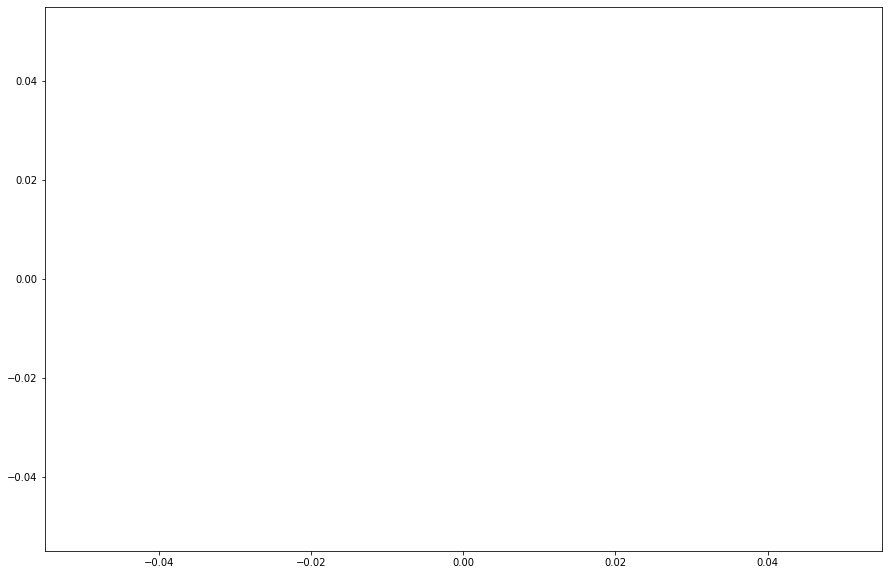

In [65]:
# Data with NaN
# 會出錯，是正常的
sns.distplot(df['PM2.5'])

由上述輸出**Data with NaN**可知，若資料中有空值，會無法做圖。
在資料說明頁面中，也明確指出**Missing data are denoted as NA.**，也就是缺值會使用空值表示。
因此在做圖前需做資料前處理，將空值去除，此時可用`pandas`套件的`dropna()`函數，將輸入資料的空值全部去除。

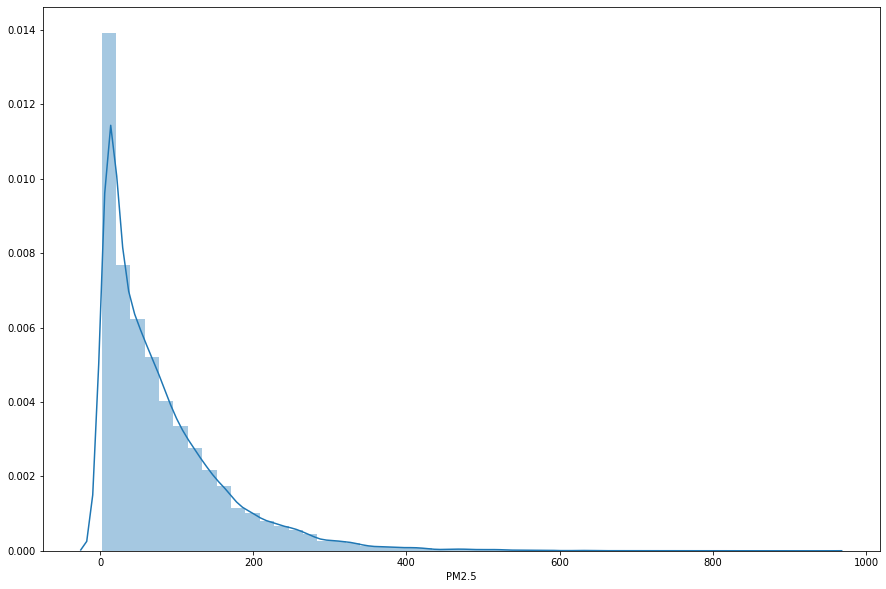

In [66]:
# Remove NaN by .dropna()
sns.distplot(df['PM2.5'].dropna())
plt.show()

由上圖可知，PM2.5濃度集中在0~100左右，只有少部分資料點的濃度大於200，最大濃度接近1000。

同理，若想觀察PM10濃度的分佈，可直接將輸入資料替換為PM10。

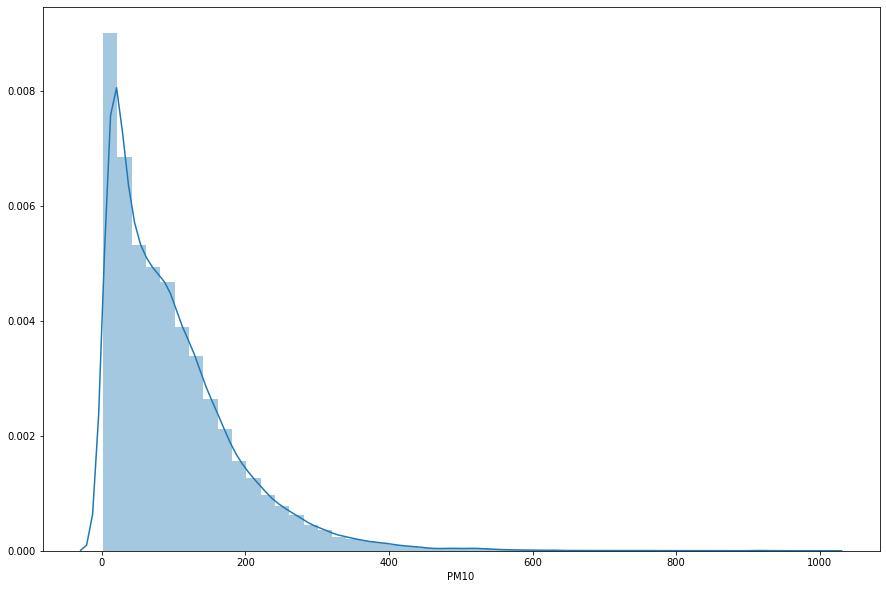

In [67]:
sns.distplot(df['PM10'].dropna())
plt.show()

由上圖可知，PM2.5濃度集中在0~100左右，只有少部分資料點的濃度大於200，最大濃度大於1000。

### 回家作業

如果要查看**NO2**的資料分佈，作**直方圖**，如何修改程式碼?

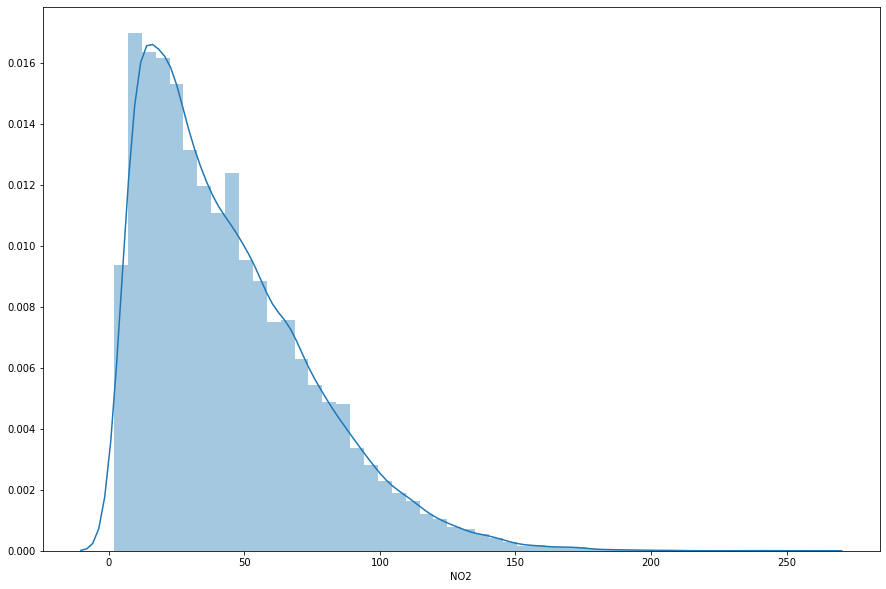

In [68]:
# 回家作業，請按照題目要求修改
# 如修改正確，執行後會呈現下方圖形
# 修改錯誤則會有錯誤訊息
# 錯誤訊息的最下方為 KeyError: '修改這裡'，表示我們的資料表中沒有'修改這裡'這個欄位，
sns.distplot(df['修改這裡'].dropna())
plt.show()

## 散佈圖 Scatter plot 

除了PM2.5濃度的數值分佈、PM2.5濃度隨著時間的變化外，我們可能也會對各項空污數據間的關聯性有興趣，此時可以用**散佈圖**將有興趣的濃度分別放在x軸與y軸。在Python中，可用`seaborn`套件的`scatterplot()`函數作圖，輸入函數有x軸與y軸數據，分列如下：

- x軸：PM2.5濃度
- y軸：PM10濃度

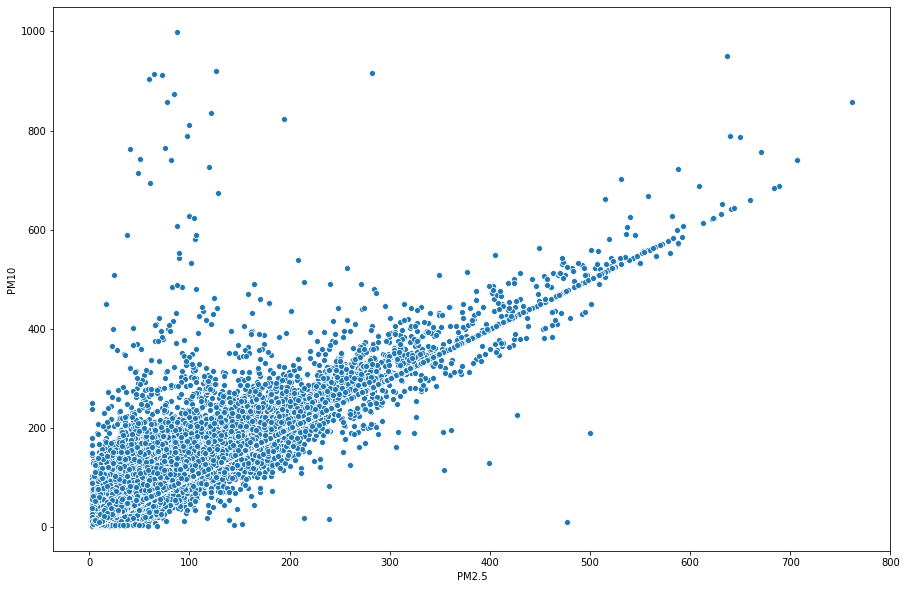

In [69]:
sns.scatterplot(df['PM2.5'],df['PM10'])
plt.show()

由上圖可知，PM2.5和PM10的資料分佈有一定關係，為了將此關係視覺化，可在散佈圖加上迴歸線。

## 散佈圖 Scatter plot + 迴歸線
在散佈圖中加上迴歸線可使用`seaborn`套件的`regplot()`函數，使用方法與`scatterplot()`函數相同。

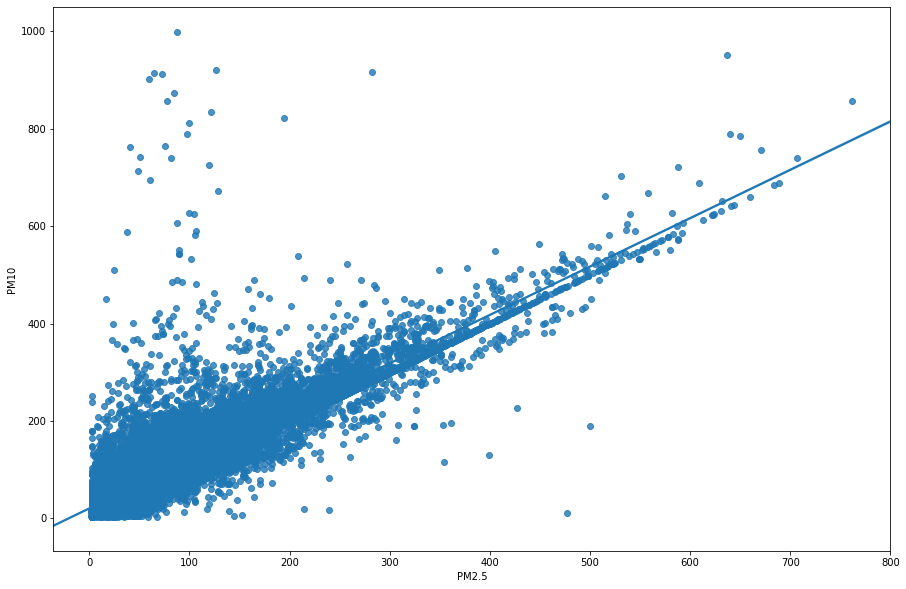

In [70]:
sns.regplot(df['PM2.5'],df['PM10'])
plt.show()

## 一次畫多個散佈圖 Pair plot
`seaborn`套件提供一進階函數`pairplot()`，直接使用此函數可針對表格中所有資料畫散佈圖。

/opt/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:829: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/opt/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:830: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


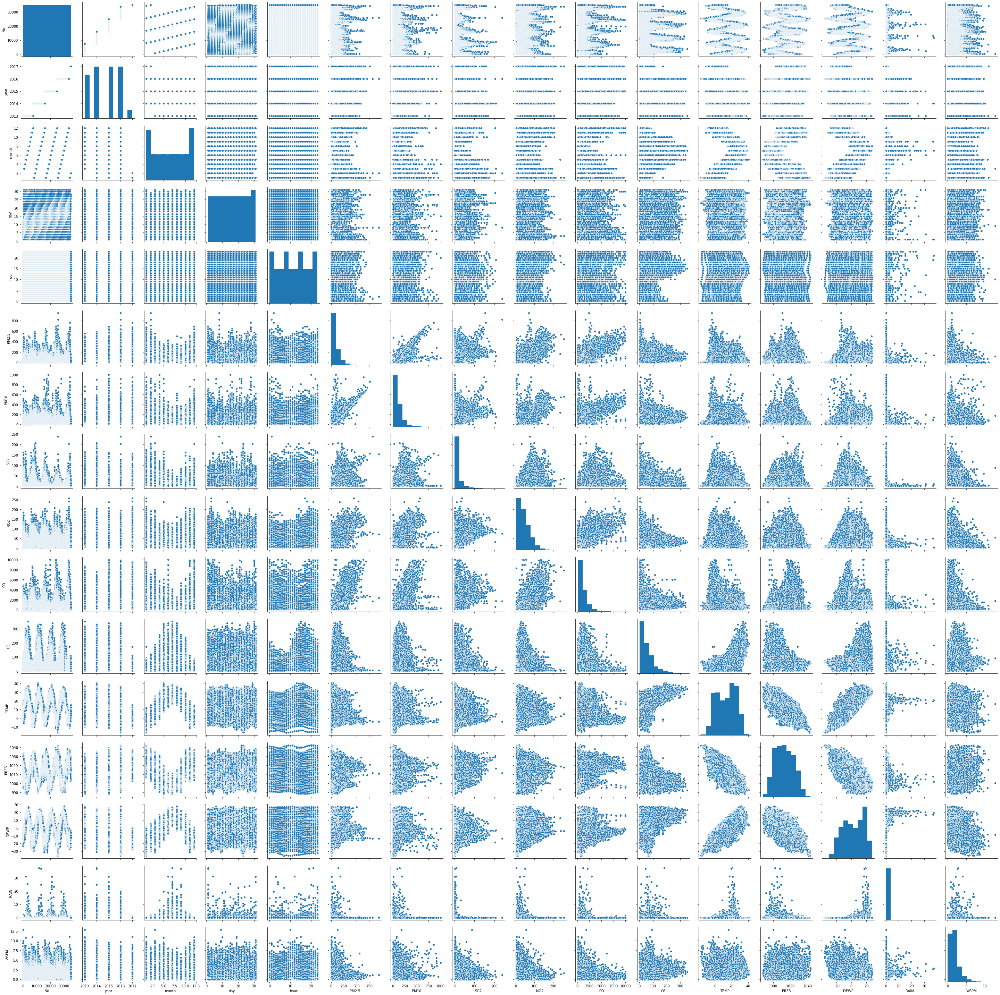

In [71]:
sns.pairplot(df)
plt.show()

### 回家作業
試著看看最近的空氣污染資料中(df)，**NO2**濃度與**SO2**濃度有沒有相關？

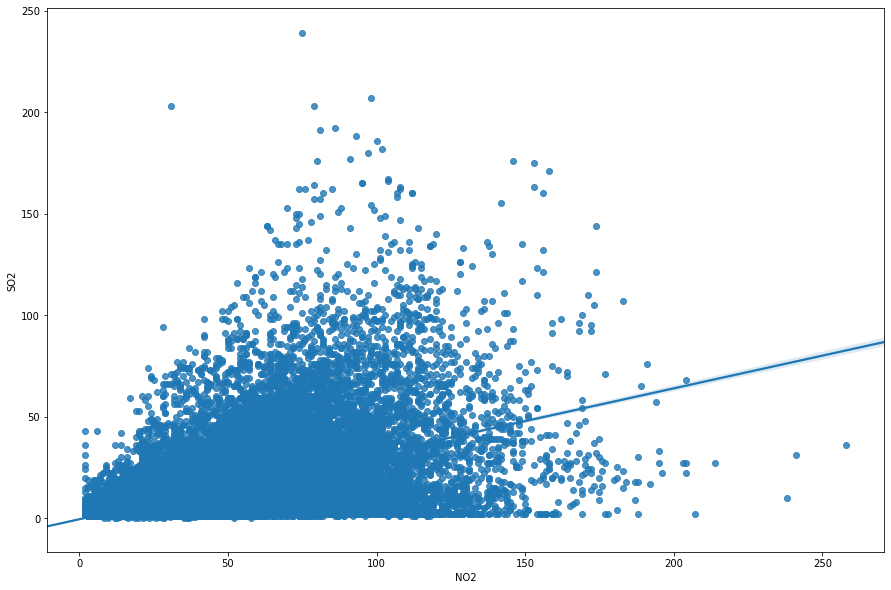

In [72]:
# 回家作業，請按照題目要求修改
# 如修改正確，會呈現如下方一樣的圖形
# 如修改錯誤，則會有錯誤訊息
# 錯誤訊息的最下方為 KeyError: '修改這裡'，表示我們的資料表中沒有'修改這裡'這個欄位，

sns.regplot(df['修改這裡'],df['修改這裡'])
plt.show()

# 比較各組或不同時間數據的圖形制作

## 折線圖 Line chart

在前述章節中，我們學會如何利用視覺化圖形觀察資料分佈，但若想要比較各組或不同時間的數據，如**PM2.5濃度隨時間的變化**，就需要使用其他視覺化的方法。
為了呈現各項數據與時間的關係，在此一樣先前範例載入的[北京空氣污染數據](https://archive.ics.uci.edu/ml/datasets/Beijing+Multi-Site+Air-Quality+Data)。
如何呈現**每天** **PM2.5濃度**的變化？

可使用`seaborn`套件的`lineplot()`函數畫折線圖，此函數需要兩個參數，分別為`x`與`y`

- x軸：日期
- y軸：PM2.5濃度

/opt/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/converter.py:103: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


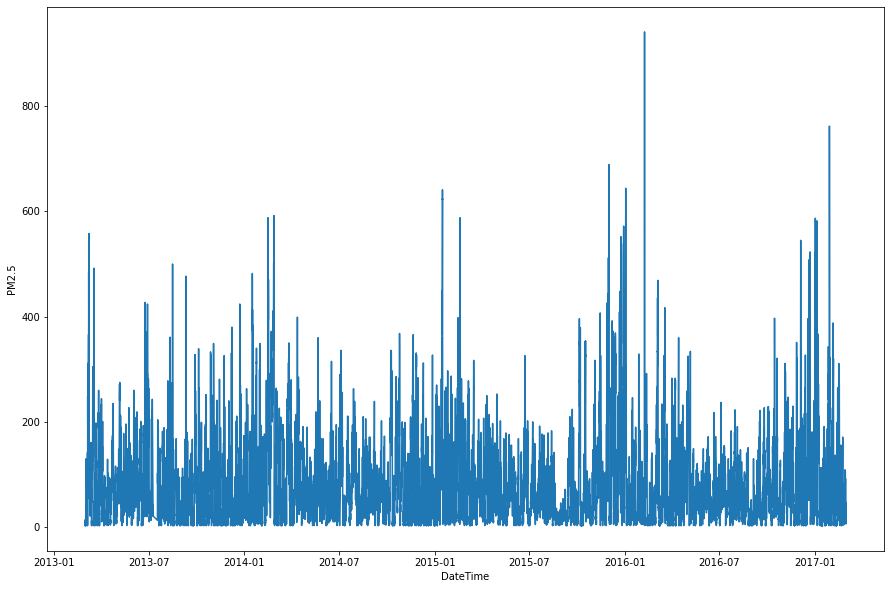

In [30]:
sns.lineplot(x=df['DateTime'], y=df['PM2.5'])
plt.show()

將資料畫出來後，很明顯的因資料點數太多，所有濃度起伏都集中在一起，無法判讀。由資料介紹可知，此份資料包含2013/3/1~2017/2/28的資料，為了呈現清楚，我們可挑選部分重要的片段來做圖。

此範例挑選最新(2017年前半年)的資料`df2017`做折線圖，使用`pandas`套件的`loc[]`方法將資料取出，使用方式為`df.loc[篩選條件]`。

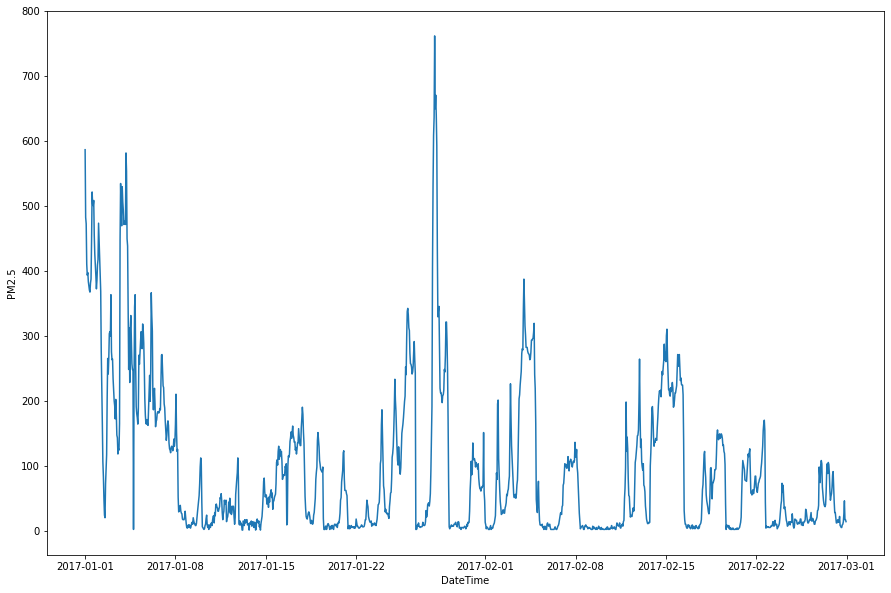

In [31]:
df2017=df.loc[((df['year']==2017) & (df['month']<=6))]
sns.lineplot(df2017['DateTime'], df2017['PM2.5'])
plt.show()

由上圖可知，Shunyi測站在2017/1/1~2017/2/28的PM2.5濃度起伏，最高點出現在大概一月底的時候，並可觀察到週期性的高低起伏，其中2017/2/8後約一週PM2.5濃度很低，可進一步推測原因。

### 回家作業
請試著呈現Shunyi測站在2017/1/1~2017/2/28的PM10濃度起伏

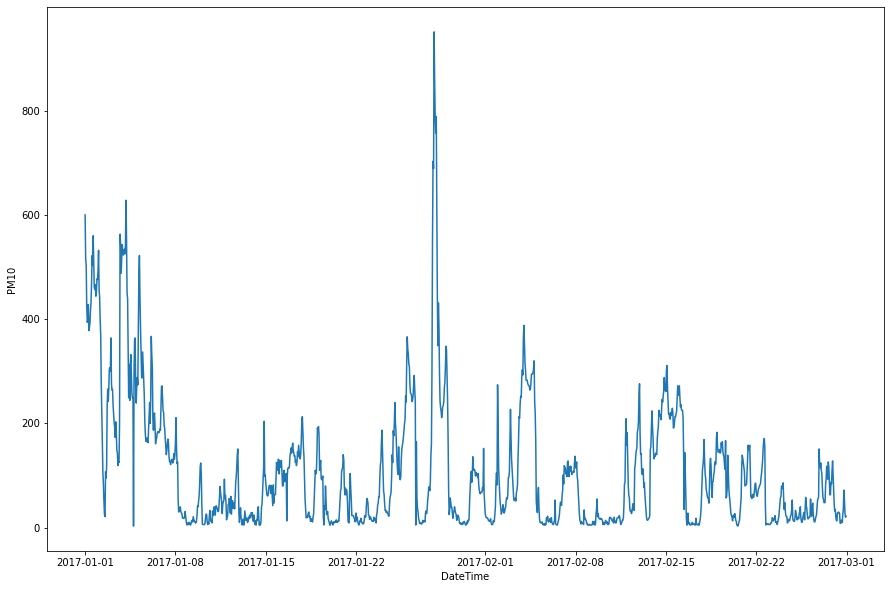

In [73]:
# 回家作業，請按照題目要求修改
# 如修改正確，會呈現如下方一樣的圖形
# 如修改錯誤，則會有錯誤訊息
# 錯誤訊息的最下方為 KeyError: '修改這裡'，表示我們的資料表中沒有'修改這裡'這個欄位，

sns.lineplot(df2017['DateTime'], df2017['修改這裡'])
plt.show()

### [進階] 如何在折線圖中同時呈現所有氣體變化呢？
用單一折線圖有時不管用

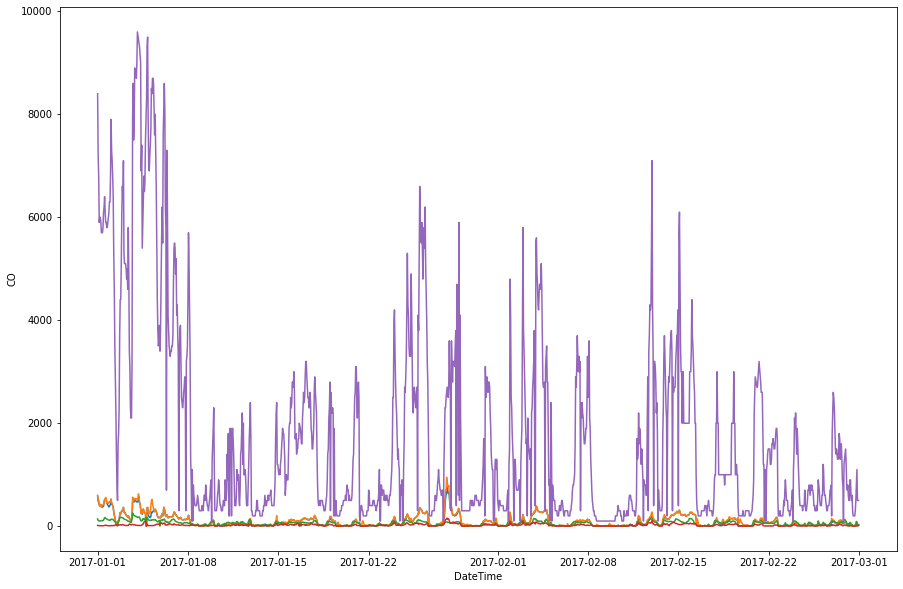

In [118]:
sns.lineplot(df2017['DateTime'], df2017['PM2.5'])
sns.lineplot(df2017['DateTime'], df2017['PM10'])
sns.lineplot(df2017['DateTime'], df2017['NO2'])
sns.lineplot(df2017['DateTime'], df2017['SO2'])
sns.lineplot(df2017['DateTime'], df2017['CO'])
plt.show()

In [119]:
df2017

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station,DateTime
33648,33649,2017,1,1,0,587.0,600.0,15.0,142.0,8400.0,7.0,-4.7,1022.9,-6.4,0.0,SSE,0.4,Shunyi,2017-01-01 00:00:00
33649,33650,2017,1,1,1,483.0,516.0,12.0,111.0,7200.0,5.0,-5.3,1023.1,-6.7,0.0,S,1.3,Shunyi,2017-01-01 01:00:00
33650,33651,2017,1,1,2,473.0,503.0,10.0,105.0,6800.0,4.0,-5.8,1023.5,-6.6,0.0,S,1.1,Shunyi,2017-01-01 02:00:00
33651,33652,2017,1,1,3,411.0,425.0,9.0,102.0,5900.0,4.0,-5.9,1023.4,-6.6,0.0,SSE,0.8,Shunyi,2017-01-01 03:00:00
33652,33653,2017,1,1,4,394.0,394.0,9.0,102.0,6000.0,29.0,-5.6,1022.6,-6.4,0.0,SSW,0.9,Shunyi,2017-01-01 04:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35059,35060,2017,2,28,19,27.0,72.0,8.0,92.0,800.0,16.0,10.3,1014.2,-12.4,0.0,W,1.8,Shunyi,2017-02-28 19:00:00
35060,35061,2017,2,28,20,47.0,55.0,17.0,86.0,1100.0,19.0,9.8,1014.5,-9.9,0.0,NW,1.5,Shunyi,2017-02-28 20:00:00
35061,35062,2017,2,28,21,18.0,28.0,4.0,30.0,500.0,64.0,9.1,1014.6,-12.7,0.0,NE,1.7,Shunyi,2017-02-28 21:00:00
35062,35063,2017,2,28,22,18.0,20.0,9.0,33.0,500.0,59.0,7.1,1015.2,-13.2,0.0,WNW,1.8,Shunyi,2017-02-28 22:00:00


In [120]:
df2017sm=df2017[['DateTime','PM2.5','PM10','NO2','SO2','CO']]
df2017sm

,DateTime,PM2.5,PM10,NO2,SO2,CO
33648,2017-01-01 00:00:00,587.0,600.0,142.0,15.0,8400.0
33649,2017-01-01 01:00:00,483.0,516.0,111.0,12.0,7200.0
33650,2017-01-01 02:00:00,473.0,503.0,105.0,10.0,6800.0
33651,2017-01-01 03:00:00,411.0,425.0,102.0,9.0,5900.0
33652,2017-01-01 04:00:00,394.0,394.0,102.0,9.0,6000.0
...,...,...,...,...,...,...
35059,2017-02-28 19:00:00,27.0,72.0,92.0,8.0,800.0
35060,2017-02-28 20:00:00,47.0,55.0,86.0,17.0,1100.0
35061,2017-02-28 21:00:00,18.0,28.0,30.0,4.0,500.0
35062,2017-02-28 22:00:00,18.0,20.0,33.0,9.0,500.0


In [121]:
df2017sm.set_index('DateTime')
df2017sm_long=pd.melt(df2017sm,id_vars='DateTime',var_name="Type")
df2017sm_long

,DateTime,Type,value
0,2017-01-01 00:00:00,PM2.5,587.0
1,2017-01-01 01:00:00,PM2.5,483.0
2,2017-01-01 02:00:00,PM2.5,473.0
3,2017-01-01 03:00:00,PM2.5,411.0
4,2017-01-01 04:00:00,PM2.5,394.0
...,...,...,...
7075,2017-02-28 19:00:00,CO,800.0
7076,2017-02-28 20:00:00,CO,1100.0
7077,2017-02-28 21:00:00,CO,500.0
7078,2017-02-28 22:00:00,CO,500.0


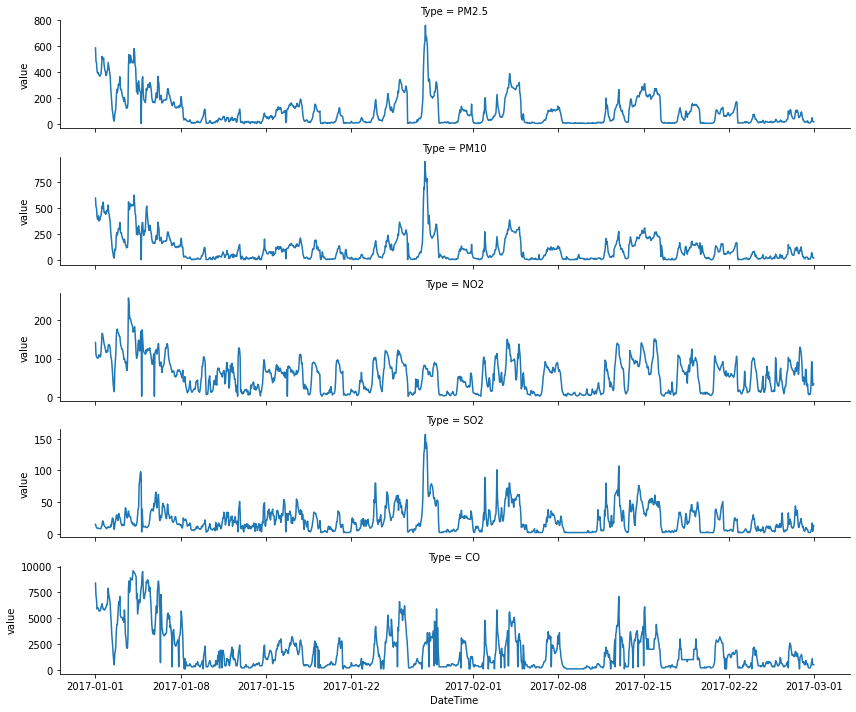

In [123]:
g = sns.FacetGrid(df2017sm_long, row="Type",height=2, aspect=6, sharey=False)
g.map(sns.lineplot, "DateTime", "value")

## 管制圖 Control chart
管制圖可視為折線圖的延伸，如上圖所示，因PM2.5濃度在自然狀態下就會高低起伏，如何判斷正常的變化以及**不正常**的變化就變得非常重要，使用管制圖可快速判斷**不正常**的數值起伏。
如需了解更多管制圖的背景知識，可參考[wiki](https://zh.wikipedia.org/wiki/%E7%AE%A1%E5%88%B6%E5%9C%96)

在此使用平均值加減**兩倍標準差**以及加減**三倍標準差**當作管制界線，並使用`matplotlib`套件的`axhline()`函數將平均值與管制界線加入原有的折線圖中。因`seaborn`是基於`matplotlib`套件為基礎開發的更高階套件，因此圖形可直接疊加。
以下範例中`axhline()`函數共有以下輸入參數
- y: 計算平均值`mean()`，計算標準差`std`，`skipna=True`為跳過空值
- color: 修改線條顏色 （綠色g、黃色y、紅色r），其他顏色設定可參考[文件](https://matplotlib.org/tutorials/colors/colors.html)
- linestyle: 修改線條樣式 （虛線），其他樣式設定可參考[文件](https://matplotlib.org/3.1.0/gallery/lines_bars_and_markers/linestyles.html)

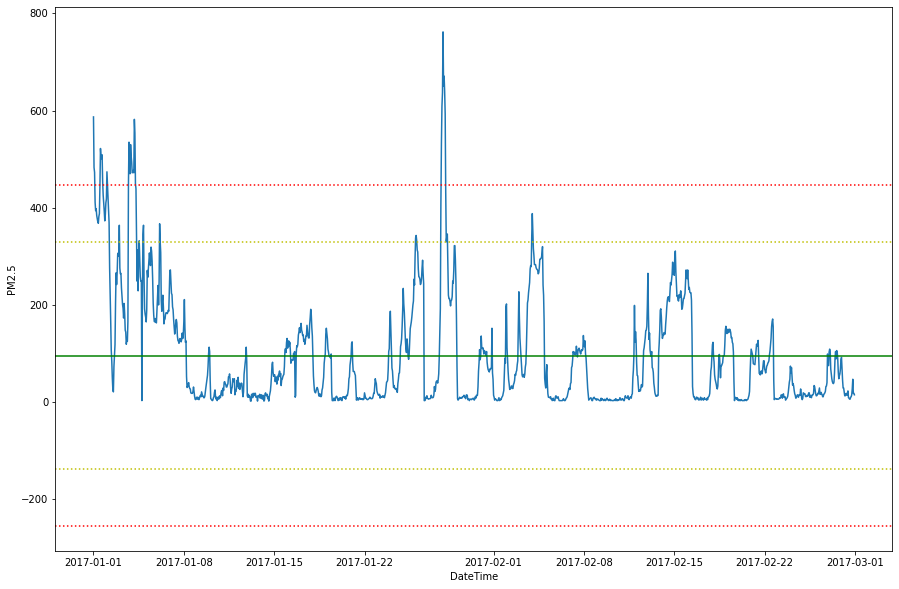

In [32]:
sns.lineplot(df2017['DateTime'], df2017['PM2.5'])
plt.axhline(y=df2017['PM2.5'].mean(skipna=True), 
            color='g', linestyle='-')
plt.axhline(y=df2017['PM2.5'].mean(skipna=True)+
            2*df2017['PM2.5'].std(), 
            color='y', linestyle=':')
plt.axhline(y=df2017['PM2.5'].mean(skipna=True)-
            2*df2017['PM2.5'].std(), 
            color='y', linestyle=':')
plt.axhline(y=df2017['PM2.5'].mean(skipna=True)+
            3*df2017['PM2.5'].std(), 
            color='r', linestyle=':')
plt.axhline(y=df2017['PM2.5'].mean(skipna=True)-
            3*df2017['PM2.5'].std(), 
            color='r', linestyle=':')
plt.show()

由上圖可知，若以三倍標準差當作管制界線，一月初與一月底的幾個高峰可能為不正常變化，應考慮調查造成此變化的原因。

## 長條圖 Bar chart 

若我們不是想要比較資料在不同日期的變化，而是想要比較資料所屬類別的數量，如在這個城市，比較吹各風向的天數，在此可使用`seaborn`套件的`barplot()`函數，其中輸入兩個參數
- x軸: 風向
- y軸: 各風向所佔天數

首先使用`pandas`的`groupby().size().reset_index()`計算資料中個風向的計數資料，並儲存成`wddf`變數。

In [74]:
wddf=df.groupby('wd').size().reset_index(name='size')
wddf

,wd,size
0,E,1153
1,ENE,1416
2,ESE,1377
3,N,3877
4,NE,3351
5,NNE,4540
6,NNW,1656
7,NW,2446
8,S,2613
9,SE,2665


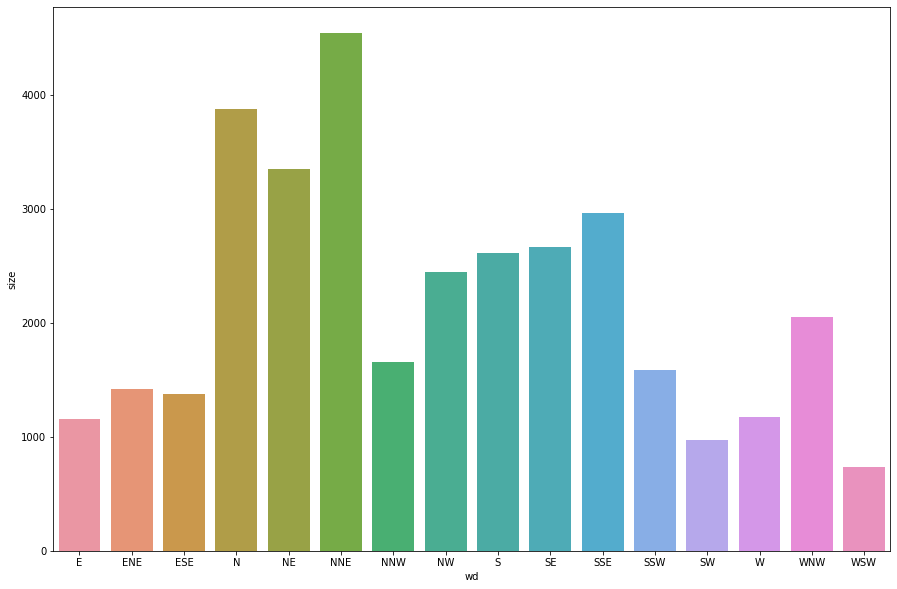

In [75]:
sns.barplot(x=wddf['wd'],y=wddf['size'])
plt.show()

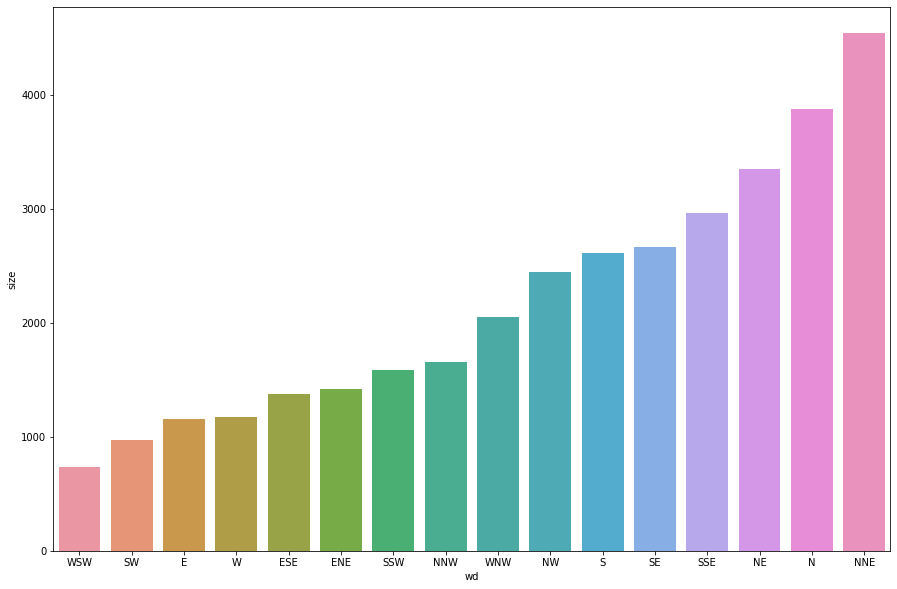

In [76]:
wddf_sorted = wddf.sort_values('size')
sns.barplot(x=wddf_sorted['wd'],y=wddf_sorted['size'])
plt.show()

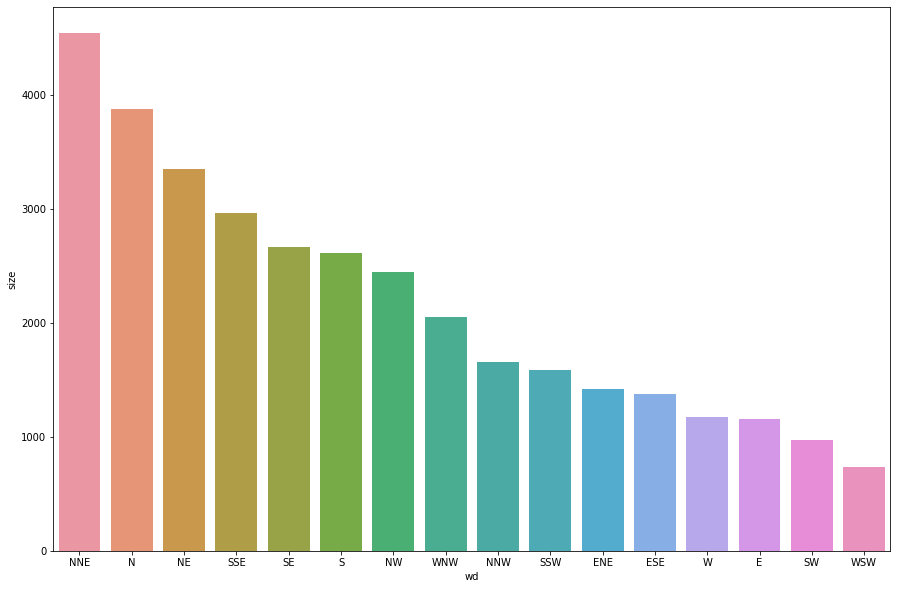

In [77]:
wddf_sorted = wddf.sort_values('size', ascending=False)
sns.barplot(x=wddf_sorted['wd'],y=wddf_sorted['size'])
plt.show()

由此圖可知此資料區間中，吹NNE風向的天數最多，再來是N，以及NE。



## 盒鬚圖 Box plot

除了用散佈圖得知PM2.5的濃度分佈外，如果想知道**每年** **PM2.5濃度** 的分佈（中位數、四分位差、離群值等）是否有差異，可使用盒鬚圖，盒鬚圖的各點意義如下：

- x軸：年份
- y軸：PM2.5濃度
- 盒（方塊）中線：中位數
- 盒（方塊）上緣：第三 四分位差
- 盒（方塊）下緣：第一 四分位差
- 鬚（線條）上緣：
- 鬚（線條）下緣：
- 點：離群值

使用`seaborn`套件的`boxplot()`函數，可製作盒鬚圖，輸入參數為：
- x軸：年份
- y軸：各年份要比較的數據分佈（此為PM2.5）

In [78]:
df2017[['year','PM2.5']]

,year,PM2.5
33648,2017,587.0
33649,2017,483.0
33650,2017,473.0
33651,2017,411.0
33652,2017,394.0
...,...,...
35059,2017,27.0
35060,2017,47.0
35061,2017,18.0
35062,2017,18.0


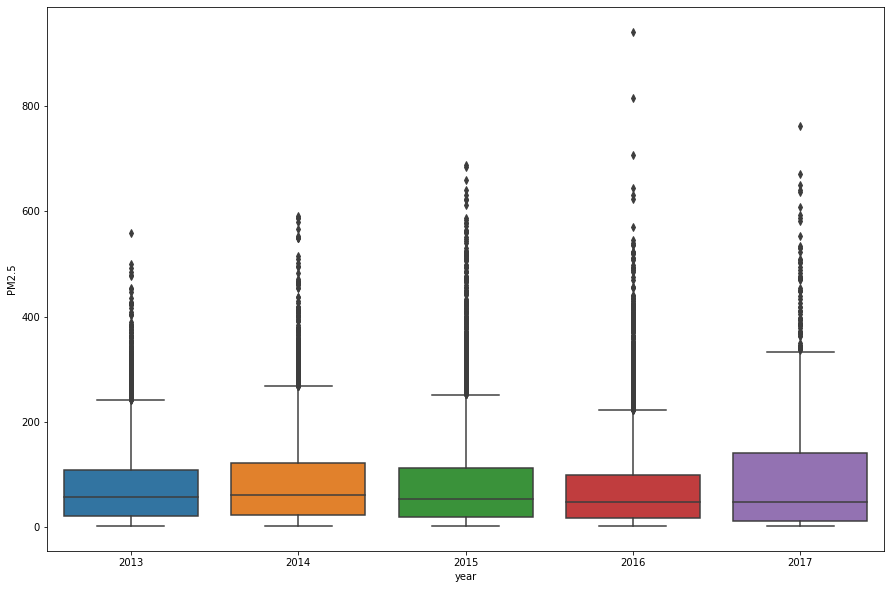

In [21]:
sns.boxplot( x=df["year"], y=df["PM2.5"] )
plt.show()

### 回家作業
使用盒鬚圖比較吹各風向的日子，PM10濃度有無差異

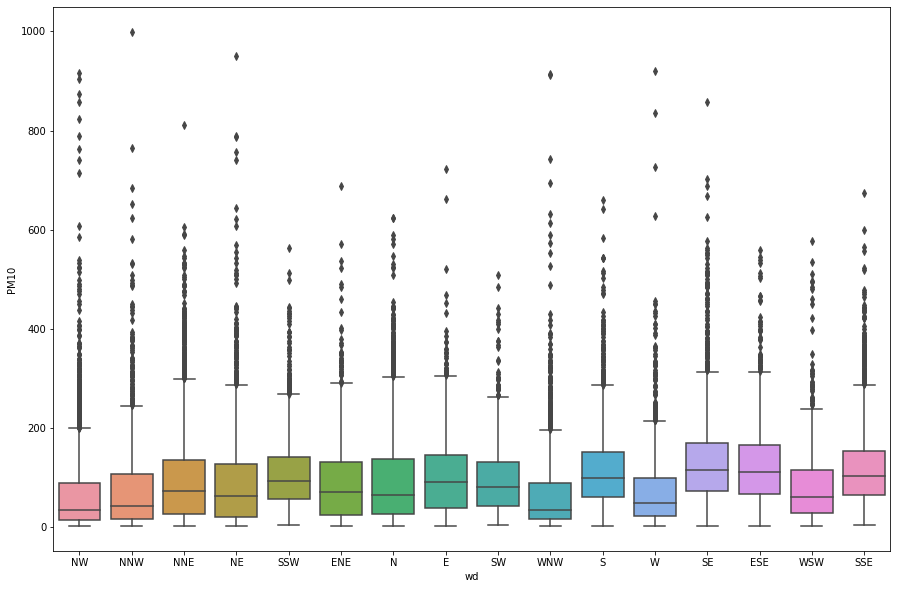

In [79]:
# 回家作業，請按照題目要求修改
# 如修改正確，會呈現如下方一樣的圖形
# 如修改錯誤，則會有錯誤訊息
# 錯誤訊息的最下方為 KeyError: '修改這裡'，表示我們的資料表中沒有'修改這裡'這個欄位，

sns.boxplot( x=df["修改這裡"], y=df["修改這裡"] )
plt.show()

# 觀察組成圖形制作

## 圓餅圖 Pie chart

若想呈現資料中不同類別所佔比例，如品質檢測通過與不通過的比例，或是整個廠區不同廠房的不良品比例等，則可用圓餅圖呈現。
以上述[北京空氣污染數據](https://archive.ics.uci.edu/ml/datasets/Beijing+Multi-Site+Air-Quality+Data)為例，若想看資料集的風向個數（意即每個風向出現在幾天的資料中），即可考慮使用圓餅圖。
首先使用`pandas`的`groupby().size().reset_index()`計算資料中個風向的計數資料，並儲存成`wddf`變數。

並使用`matplotlib`套件的`pie()`函數作圖，在此範例中，放入兩個參數，分別為
- x: 圓餅圖角度大小分配依據
- labels: 各角度的資料標籤

In [80]:
wddf=df.groupby('wd').size().reset_index(name='size')
wddf

,wd,size
0,E,1153
1,ENE,1416
2,ESE,1377
3,N,3877
4,NE,3351
5,NNE,4540
6,NNW,1656
7,NW,2446
8,S,2613
9,SE,2665


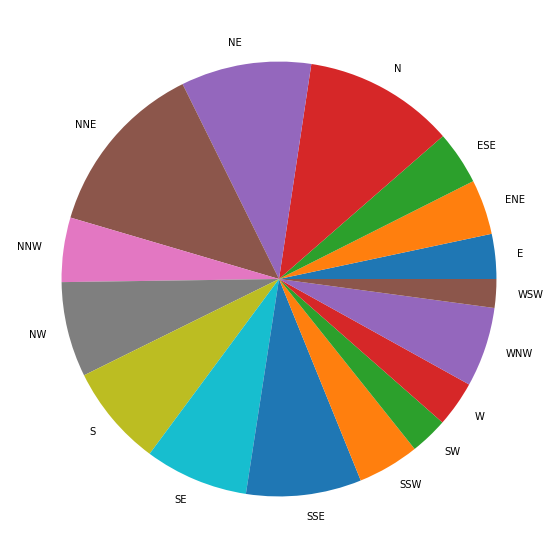

In [81]:
plt.pie(x=wddf['size'],labels=wddf['wd'])
plt.show()

由上圖所示，其實非常難分辨出到底哪個風向佔較多天，通常圓餅圖不適合使用在太多分類的資料中，三～四個分類項目就是極限了，因此這個視覺化呈現應選用長條圖。

# 呈現相關性的圖形制作

## 泡泡圖 Bubble plot
泡泡圖是散佈圖的延伸，散佈圖除了可以觀察資料分佈外，也可呈現兩組資料的相關性。

在散佈圖中，每個點代表一組X與Y的數值，因此可比較XY數值，也可看出X與Y的關係。如比較PM2.5與PM10是否有關，在先前的範例中，可看出PM2.5和PM10是顯著的相關，也就是PM2.5越高，PM10就越高。

泡泡圖維持散佈圖的X與Y軸關係，但在點的大小上增加變化，將原本二維(XY)的圖形延伸成三維(XY與泡泡大小)。

首先如先前的教學，我們先做一般的散佈圖，X軸為PM2.5，Y軸為PM10：

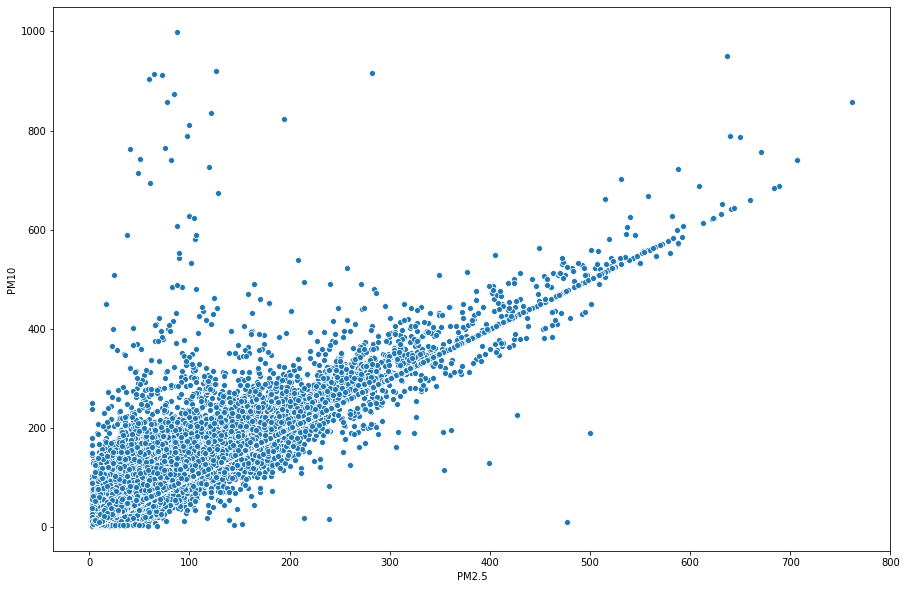

In [82]:
sns.scatterplot(df['PM2.5'],df['PM10'])
plt.show()

若我們想知道風速與PM2.5和PM10濃度的關係，可將點的大小（size）設定為風速，即可製作泡泡圖：

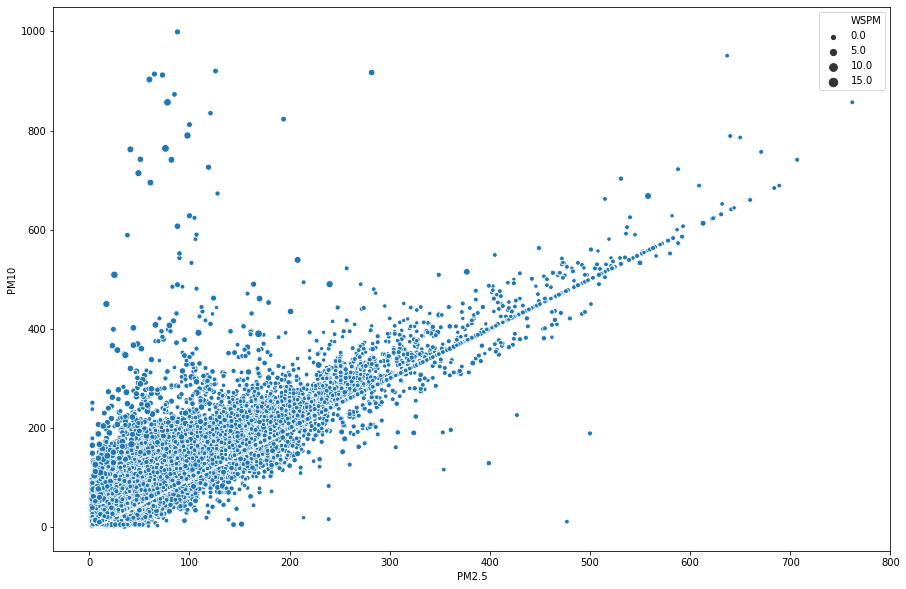

In [83]:
sns.scatterplot(df['PM2.5'],df['PM10'],size=df['WSPM'])
plt.show()

由上圖可以發現各點的大小差距不大，導致分不太出來各點的大小差距，此時可以透過`sizes`參數設定最大點與最小點的大小，即可畫出點大小差異較大的圖形。

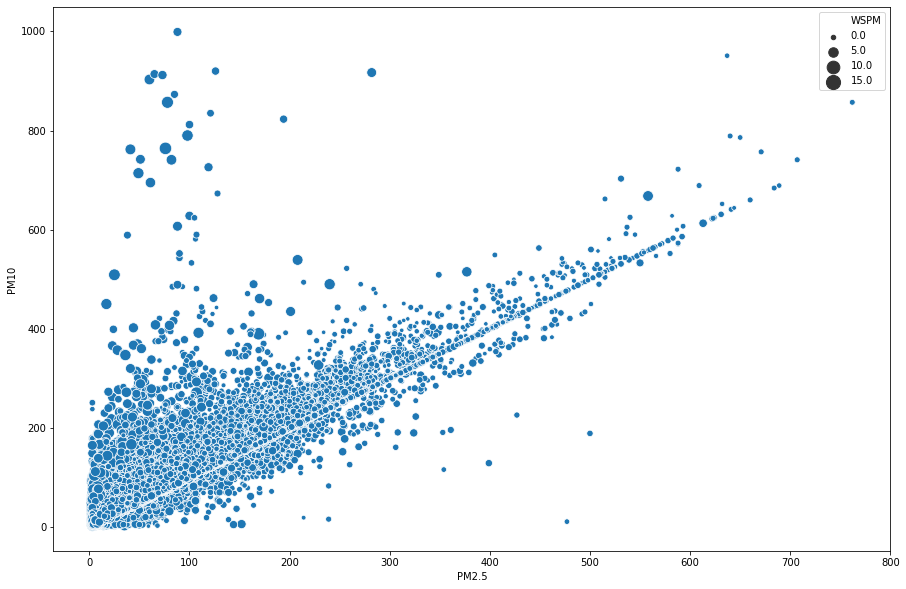

In [84]:
sns.scatterplot(df['PM2.5'],df['PM10'],size=df['WSPM'],sizes=(20, 200))
plt.show()

### 回家作業
使用泡泡圖呈現NO2與SO2的關係，並用氣溫（TEMP）當作泡泡大小，觀察這三個資料是否有相關

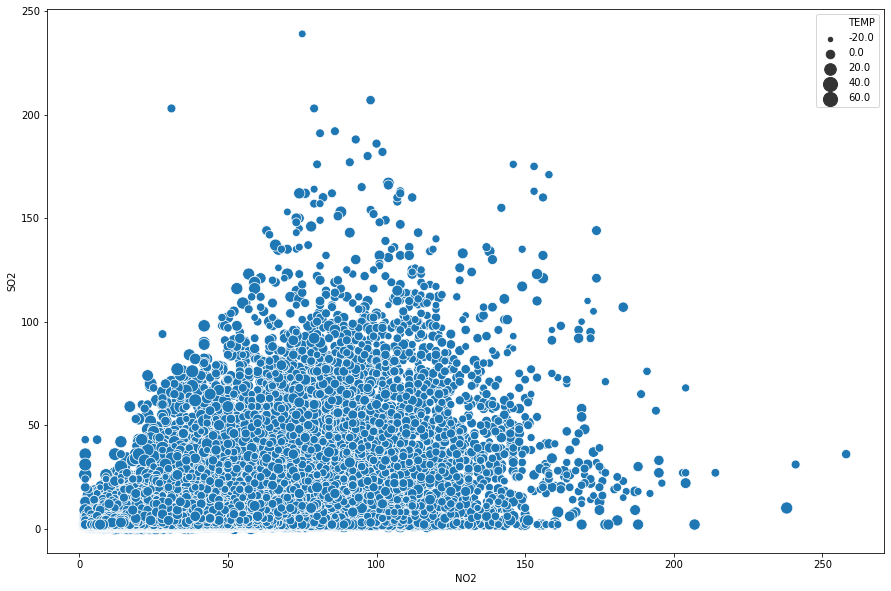

In [86]:
# 回家作業，請按照題目要求修改
# 如修改正確，會呈現如下方一樣的圖形
# 如修改錯誤，則會有錯誤訊息
# 錯誤訊息的最下方為 KeyError: '修改這裡'，表示我們的資料表中沒有'修改這裡'這個欄位，

sns.scatterplot(df['修改這裡'],df['修改這裡'],size=df['修改這裡'],sizes=(20, 200))
plt.show()

# 進階資料作圖

## 熱度圖 Heatmap
熱度圖使用顏色的深淺來表示數值的大小，通常會搭配XY兩軸的變量，所以使用一張圖就能表示三個維度的資訊，使用`seaborn`套件的`heatmap()`函數，即可製作熱度圖。在製作熱度圖之前，必須先將輸入資料處理成對應格式，舉例來說，若想使用熱度圖呈現每天（X軸為日期），PM2.5、PM10、SO2、NO2（Y軸為此四種污染物）的濃度（著色），我們必須將Pandas資料框的index設定為日期，PM2.5、PM10、SO2以及NO2為欄位名稱，各欄位的值是當日該物質的濃度。

首先先設定Index：

In [46]:
df1701=df.loc[((df['year']==2017) & (df['month']<=1))]
df1701_wide=df1701[['DateTime','PM2.5','PM10','SO2','NO2']]
df1701_wide=df1701_wide.set_index('DateTime')
df1701_wide

,PM2.5,PM10,SO2,NO2
DateTime,,,,
2017-01-01 00:00:00,587.0,600.0,15.0,142.0
2017-01-01 01:00:00,483.0,516.0,12.0,111.0
2017-01-01 02:00:00,473.0,503.0,10.0,105.0
2017-01-01 03:00:00,411.0,425.0,9.0,102.0
2017-01-01 04:00:00,394.0,394.0,9.0,102.0
...,...,...,...,...
2017-01-31 19:00:00,69.0,77.0,23.0,62.0
2017-01-31 20:00:00,72.0,72.0,36.0,62.0
2017-01-31 21:00:00,152.0,152.0,30.0,56.0


設定完Index後，可發現DateTime欄位的欄位名稱比其他欄位名稱位置更下面一些，這樣就是有設定成功。
觀察資料框可發現每個氣體的濃度大小值不太一定，為了合理的視覺化這些數據，使用平均與標準差將資料標準化。

In [47]:
df1701_wide.mean()

PM2.5    117.814266
PM10     130.853297
SO2       22.674293
NO2       60.504711
dtype: float64

In [48]:
df1701_wide.std()

PM2.5    136.780819
PM10     148.638026
SO2       20.355505
NO2       45.127966
dtype: float64

In [49]:
nor_df1701_wide=(df1701_wide-df1701_wide.mean())/df1701_wide.std()
nor_df1701_wide

,PM2.5,PM10,SO2,NO2
DateTime,,,,
2017-01-01 00:00:00,3.430201,3.156303,-0.377013,1.805871
2017-01-01 01:00:00,2.669861,2.591172,-0.524393,1.118936
2017-01-01 02:00:00,2.596751,2.503711,-0.622647,0.985980
2017-01-01 03:00:00,2.143471,1.978947,-0.671774,0.919503
2017-01-01 04:00:00,2.019185,1.770386,-0.671774,0.919503
...,...,...,...,...
2017-01-31 19:00:00,-0.356879,-0.362312,0.016001,0.033134
2017-01-31 20:00:00,-0.334947,-0.395950,0.654649,0.033134
2017-01-31 21:00:00,0.249931,0.142270,0.359888,-0.099821


標準化後，各資料的大小差異變小，在作圖時各氣體的顏色深淺差距才不會太大。
最後將資料轉置（列與欄互換），使用pandas內建的`transpose()`函數。

In [50]:
nor_df1701_long=pd.melt(nor_df1701_wide.reset_index(),id_vars='DateTime')
nor_df1701_long

,DateTime,variable,value
0,2017-01-01 00:00:00,PM2.5,3.430201
1,2017-01-01 01:00:00,PM2.5,2.669861
2,2017-01-01 02:00:00,PM2.5,2.596751
3,2017-01-01 03:00:00,PM2.5,2.143471
4,2017-01-01 04:00:00,PM2.5,2.019185
...,...,...,...
2971,2017-01-31 19:00:00,NO2,0.033134
2972,2017-01-31 20:00:00,NO2,0.033134
2973,2017-01-31 21:00:00,NO2,-0.099821
2974,2017-01-31 22:00:00,NO2,-0.410050


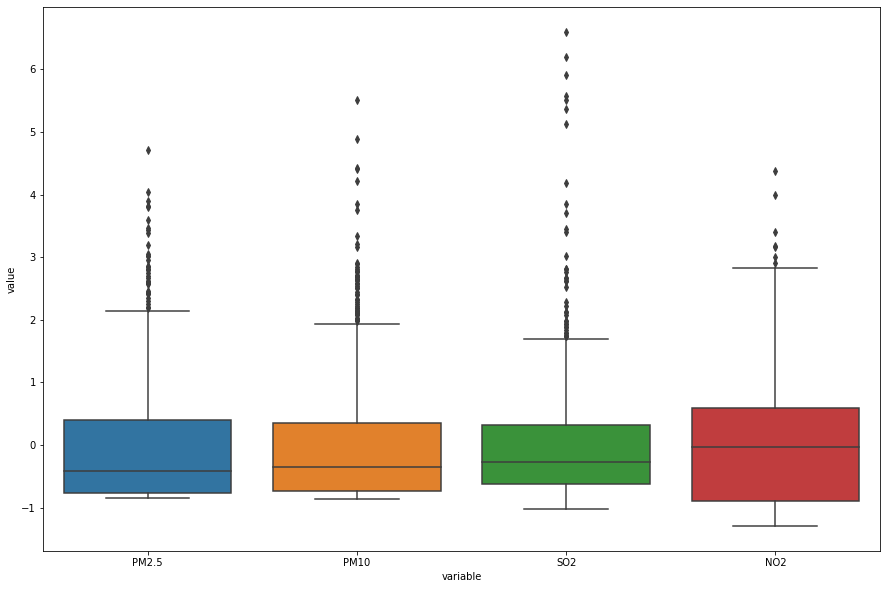

In [51]:
sns.boxplot(x=nor_df1701_long["variable"], y=nor_df1701_long["value"])
plt.show()

In [52]:
nor_df1701_wide = nor_df1701_wide.transpose()
nor_df1701_wide

DateTime,2017-01-01 00:00:00,2017-01-01 01:00:00,2017-01-01 02:00:00,2017-01-01 03:00:00,2017-01-01 04:00:00,2017-01-01 05:00:00,2017-01-01 06:00:00,2017-01-01 07:00:00,2017-01-01 08:00:00,2017-01-01 09:00:00,...,2017-01-31 14:00:00,2017-01-31 15:00:00,2017-01-31 16:00:00,2017-01-31 17:00:00,2017-01-31 18:00:00,2017-01-31 19:00:00,2017-01-31 20:00:00,2017-01-31 21:00:00,2017-01-31 22:00:00,2017-01-31 23:00:00
PM2.5,3.430201,2.669861,2.596751,2.143471,2.019185,2.048429,1.946075,1.902209,1.851032,1.829100,...,-0.378812,-0.386123,-0.408056,-0.364190,-0.371501,-0.356879,-0.334947,0.249931,-0.422678,-0.517721
PM10,3.156303,2.591172,2.503711,1.978947,1.770386,1.797297,1.999130,1.662742,1.703109,1.763658,...,-0.436317,-0.443045,-0.422861,-0.422861,-0.422861,-0.362312,-0.395950,0.142270,-0.443045,-0.564144
SO2,-0.377013,-0.524393,-0.622647,-0.671774,-0.671774,-0.671774,-0.671774,-0.720900,-0.720900,-0.720900,...,0.065128,0.065128,0.016001,0.016001,0.016001,0.016001,0.654649,0.359888,0.114254,-0.327886
NO2,1.805871,1.118936,0.985980,0.919503,0.919503,0.897344,0.985980,1.096776,1.052458,0.963821,...,-0.764597,-0.675960,-0.742438,-0.764597,-0.720279,0.033134,0.033134,-0.099821,-0.410050,-0.720279


最後將資料放入`seaborn`套件的`heatmap()`函數，即可製作熱度圖。

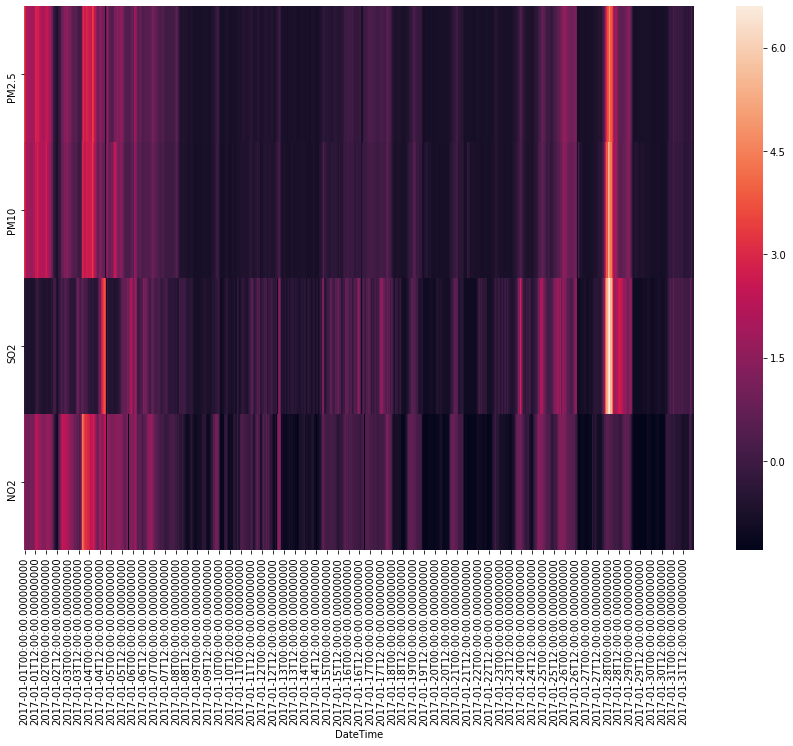

In [53]:
ax = sns.heatmap(nor_df1701_wide)
plt.show()

### 月曆熱度圖 
月曆熱度圖是熱度圖的延伸，一般來說，月曆熱度圖的各維度為：
- X軸代表每年的"週"
- Y軸代表星期一至星期天
- 顏色的深淺則代表欲觀察數值
通常是為了觀察或呈現某一數值是否有季節或是隨著星期變化的趨勢。
在Python中，`calmap`套件提供非常快速製作月曆熱度圖的方法。與製作熱度圖相同，在製作月曆熱度圖時，也必須對資料做一定的處理。
首先將日期與感興趣的資料取出，方便後續呈現

In [54]:
import calmap
df2017_cal=df2017[['DateTime','PM2.5']]
df2017_cal

,DateTime,PM2.5
33648,2017-01-01 00:00:00,587.0
33649,2017-01-01 01:00:00,483.0
33650,2017-01-01 02:00:00,473.0
33651,2017-01-01 03:00:00,411.0
33652,2017-01-01 04:00:00,394.0
...,...,...
35059,2017-02-28 19:00:00,27.0
35060,2017-02-28 20:00:00,47.0
35061,2017-02-28 21:00:00,18.0
35062,2017-02-28 22:00:00,18.0


設定完後，可發現每天其實不只有一個測量數值，資料中每小時都有一筆紀錄，為了呈現“每日”的變化，在此選擇將每小時的資料平均，計算成“每日”濃度。
將每日每小時的資料總結成"每日"資料可使用`pandas`的`resample`函數，搭配`mean()`計算平均值。

In [55]:
df2017_cal=df2017_cal.resample('D', on='DateTime').mean()
df2017_cal

,PM2.5
DateTime,
2017-01-01,431.416667
2017-01-02,235.708333
2017-01-03,286.500000
2017-01-04,338.833333
2017-01-05,228.000000
2017-01-06,219.875000
2017-01-07,156.250000
2017-01-08,51.416667
2017-01-09,27.041667


完成資料處理後，即可使用`calmap`的`yearplot`函數，製作月曆熱度圖。

/opt/anaconda3/lib/python3.7/site-packages/calmap/__init__.py:221: FutureWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated
  for i in monthticks])


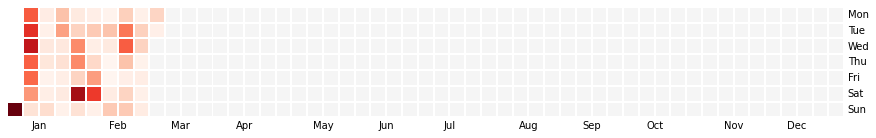

In [56]:
calmap.yearplot(df2017_cal['PM2.5'], year=2017)
plt.show()

### 矩形圖 Tree map

Treemap(矩形式樹狀結構繪圖法)是以二維平面的方式展示包含階層結構（hierarchical）形式的統計資訊，可設定得值包括面積、顏色以及階層。

In [57]:
import squarify 
df = pd.DataFrame({'nb_people':[8,3,4,2], 
                   'group':["group A", "group B", "group C", "group D"] })
df


,nb_people,group
0,8,group A
1,3,group B
2,4,group C
3,2,group D


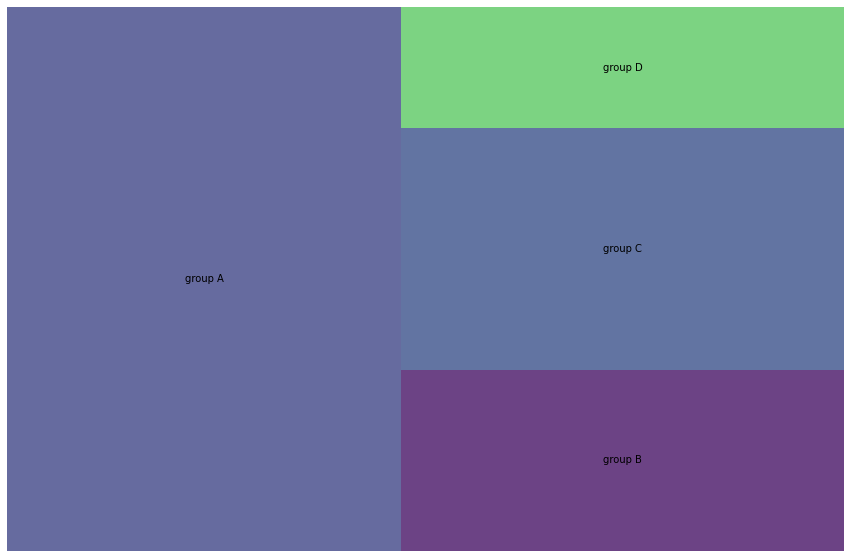

In [58]:
squarify.plot(sizes=df['nb_people'], 
              label=df['group'], alpha=.8 )
plt.axis('off')
plt.show()

## 圖形樣式參數設定

### 顏色

通常透過修改`color`參數調整，可修改線條、點、面積等顏色，各顏色的設定方式可[參考文件](https://matplotlib.org/tutorials/colors/colors.html)，或是下圖（截自[參考文件](https://matplotlib.org/tutorials/colors/colors.html)）。

![color](color.png)

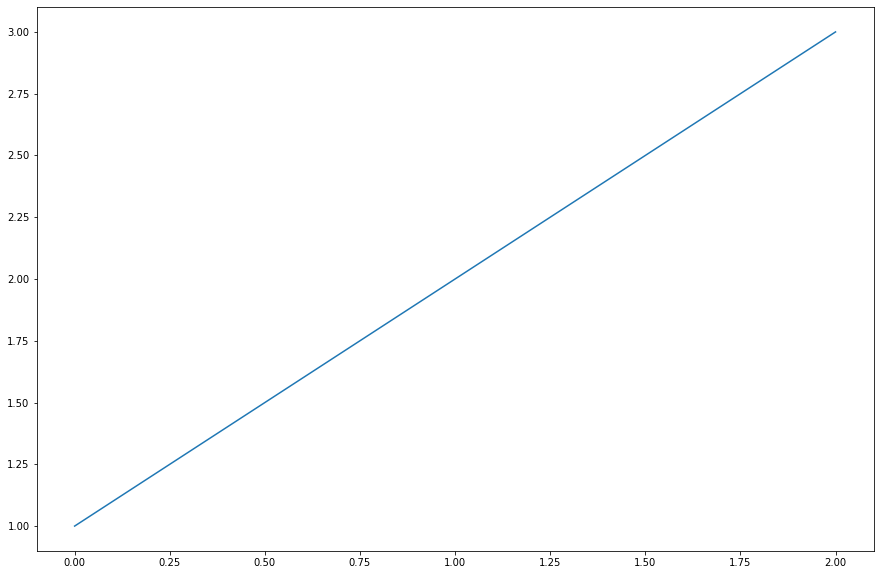

In [27]:
plt.plot([1,2,3])
plt.show()

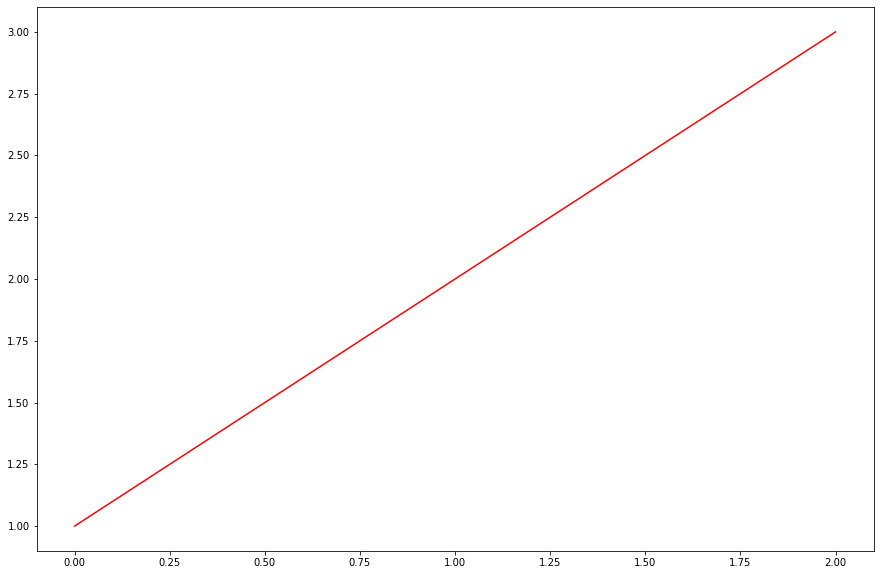

In [28]:
plt.plot([1,2,3],color="red")
plt.show()

### 點的樣式

通常透過修改`markers`參數調整，可將點改為圓形、方形等，設定可[參考文件](https://matplotlib.org/api/markers_api.html)，或是下圖（截自[參考文件](https://matplotlib.org/api/markers_api.html)）。

![markers](markers.png)


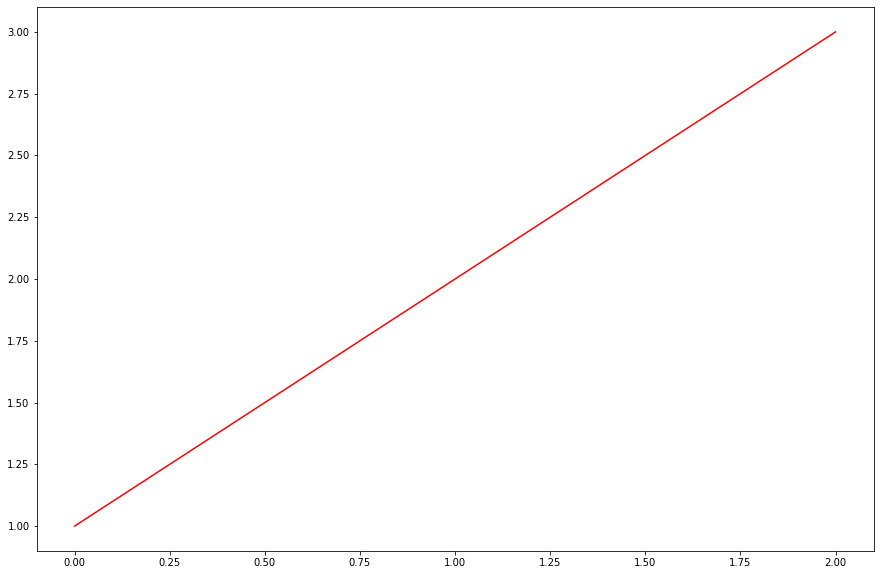

In [29]:
plt.plot([1,2,3],color="red")
plt.show()

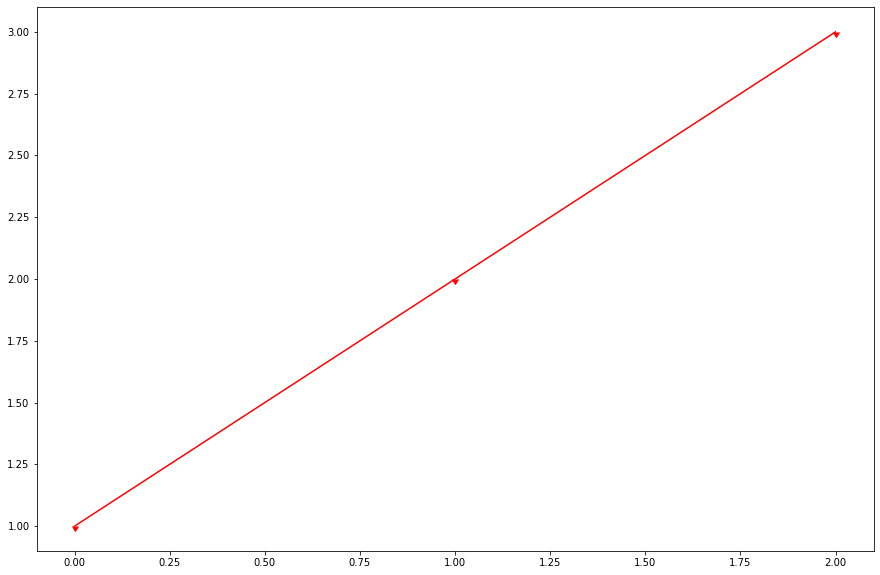

In [30]:
plt.plot([1,2,3],color="red", marker=11)
plt.show()

### 線的樣式

- linestyle: 修改線條樣式 （虛線），其他樣式設定可參考[文件](https://matplotlib.org/3.1.0/gallery/lines_bars_and_markers/linestyles.html)

![linestyles](https://matplotlib.org/3.1.0/_images/sphx_glr_linestyles_001.png)

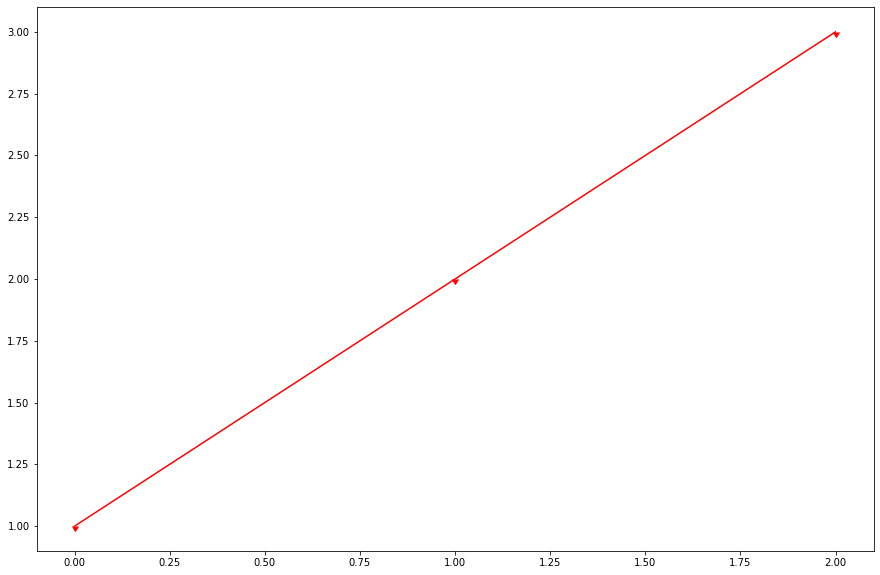

In [31]:
plt.plot([1,2,3],color="red", marker=11)
plt.show()

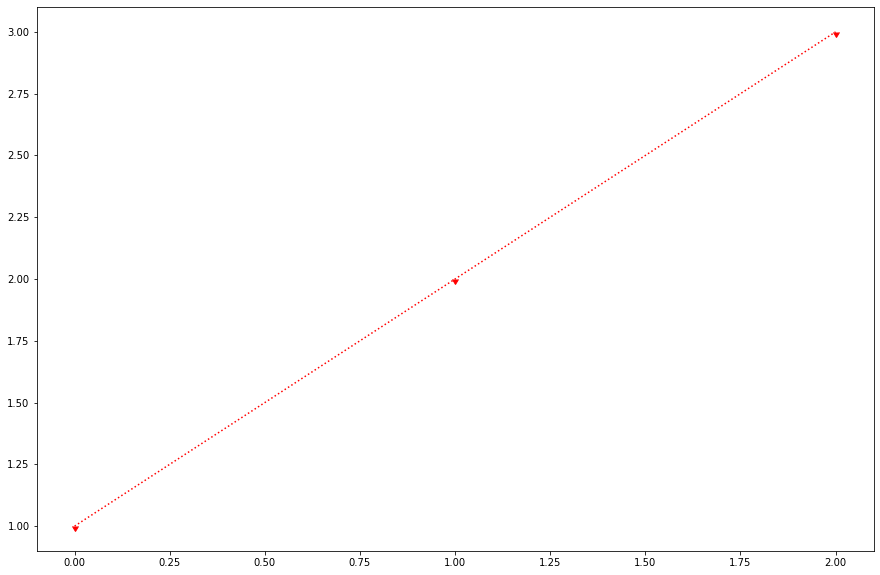

In [32]:
plt.plot([1,2,3],color="red", 
         marker=11, linestyle='dotted')
plt.show()

### XY軸的名字

https://matplotlib.org/tutorials/introductory/pyplot.html

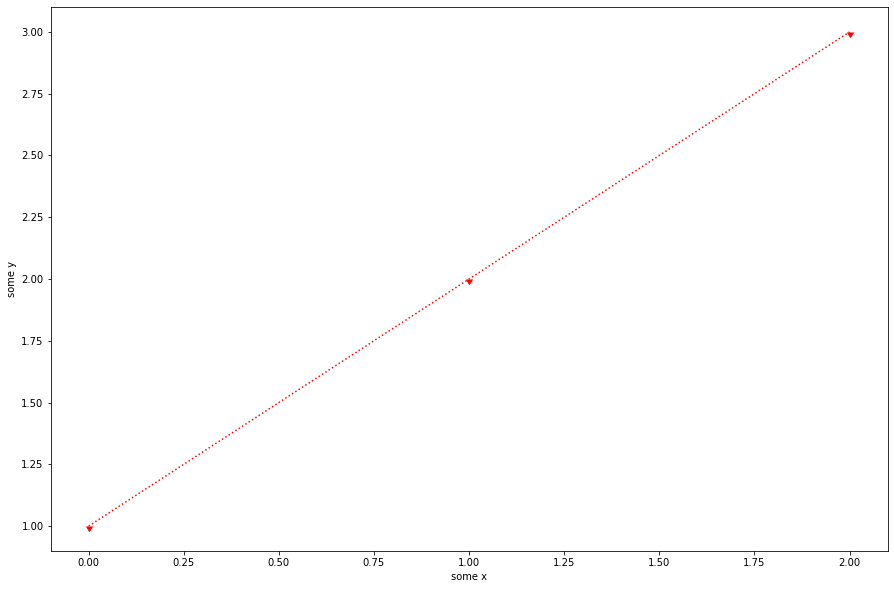

In [33]:
plt.plot([1,2,3],color="red", 
         marker=11, linestyle='dotted')
plt.xlabel('some x')
plt.ylabel('some y')
plt.show()

### 標題

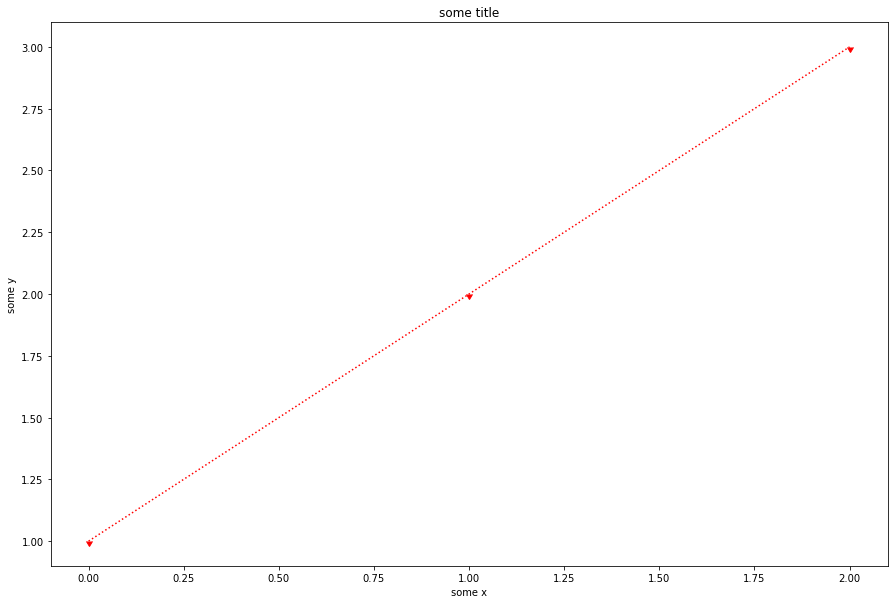

In [34]:
plt.plot([1,2,3],color="red", 
         marker=11, linestyle='dotted')
plt.xlabel('some x')
plt.ylabel('some y')
plt.title('some title')
plt.show()

## 圖形匯出與分享

製做完圖形後，若需製作投影片或寄出分享，可使用指令儲存。

### 儲存

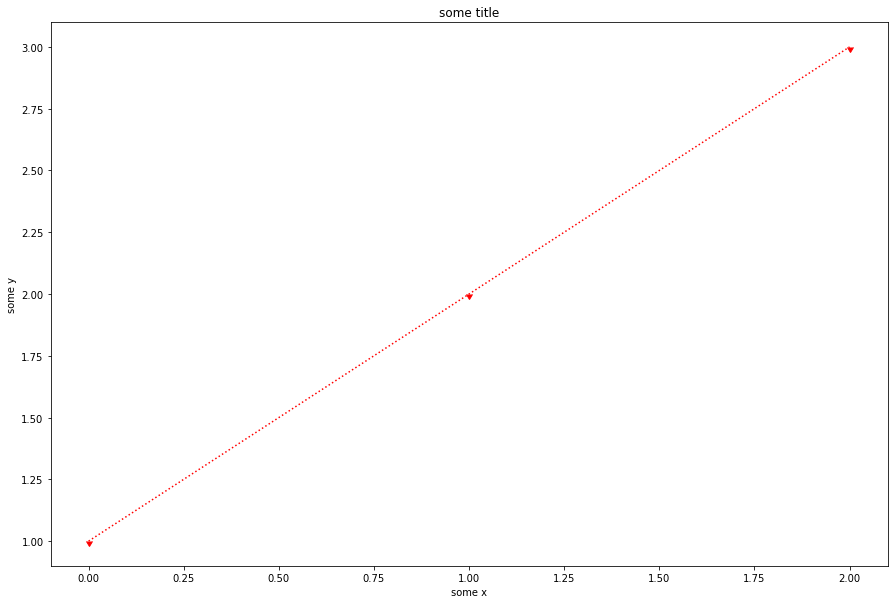

In [35]:
plt.plot([1,2,3],color="red", 
         marker=11, linestyle='dotted')
plt.xlabel('some x')
plt.ylabel('some y')
plt.title('some title')
plt.savefig('saved_fig.png')

### plotly互動網頁製作

plotly是一個線上分析與視覺化的工具，如需線上作圖，可至https://plot.ly/ 建立帳號並開始作圖。Plotly也提供套件Python使用，使用者可以透過安裝plotly套件在Python中畫基於Plotly.py的圖表。

In [36]:
import plotly.express as px
fig = px.scatter(x=[0, 1, 2, 3, 4], y=[0, 1, 4, 9, 16])
fig.show()

# Python資料視覺化參考資料

- [Python Graph Gallery](https://python-graph-gallery.com/)
- [Matplotlib官方說明文件](https://matplotlib.org/)
- [Seaborn官方說明文件](https://seaborn.pydata.org/introduction.html)